In [1]:
import atomsci
import deepchem as dc
import warnings
warnings.filterwarnings('ignore')
import json
import numpy as np
import pandas as pd
import os
import requests
import sys
import io

/home/jupyter/atomsci/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (/home/jupyter/atomsci/lib/python3.8/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'pytorch_lightning'
Skipped loading some Jax models, missing a dependency. jax requires jaxlib to be installed. See https://github.com/google/jax#installation for installation instructions.


In [2]:
from atomsci.ddm.pipeline import parameter_parser as parse
from atomsci.ddm.pipeline import perf_data
from atomsci.ddm.pipeline import model_pipeline as mp
import atomsci.ddm.utils.curate_data as curate_data
import atomsci.ddm.utils.struct_utils as struct_utils
from atomsci.ddm.pipeline import perf_plots as pp

2023-07-14 18:51:49,251 Model tracker client not supported in your environment; will save models in filesystem only.


In [3]:
os.getcwd()

'/home/jupyter/Summer_AMPL/Renate/QM9_Curation'

In [4]:
working_dir = os.getcwd()

In [6]:
raw_df = pd.read_csv('qm9-Copy1.csv')

In [20]:
raw_df.shape

NameError: name 'raw_df' is not defined

In [8]:
raw_df.columns

Index(['mol_id', 'smiles', 'A', 'B', 'C', 'mu', 'alpha', 'homo', 'lumo', 'gap',
       'r2', 'zpve', 'u0', 'u298', 'h298', 'g298', 'cv', 'u0_atom',
       'u298_atom', 'h298_atom', 'g298_atom'],
      dtype='object')

In [9]:
select_df = raw_df[['mol_id','smiles','homo','lumo','gap']]
select_df.shape

(133885, 5)

In [10]:
select_df.head()

,mol_id,smiles,homo,lumo,gap
0,gdb_1,C,-0.3877,0.1171,0.5048
1,gdb_2,N,-0.2570,0.0829,0.3399
2,gdb_3,O,-0.2928,0.0687,0.3615
3,gdb_4,C#C,-0.2845,0.0506,0.3351
4,gdb_5,C#N,-0.3604,0.0191,0.3796


In [12]:
## Use this to save your above file as a .csv, so you can skip in future.
select_df.to_csv('select_qm9_data.csv')


In [13]:
select_df.head()

,mol_id,smiles,homo,lumo,gap
0,gdb_1,C,-0.3877,0.1171,0.5048
1,gdb_2,N,-0.2570,0.0829,0.3399
2,gdb_3,O,-0.2928,0.0687,0.3615
3,gdb_4,C#C,-0.2845,0.0506,0.3351
4,gdb_5,C#N,-0.3604,0.0191,0.3796


In [14]:
select_df['rdkit_smiles'] = select_df['smiles'].apply(curate_data.base_smiles_from_smiles)

2023-06-26 15:33:16,692 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
2023-06-26 15:33:27,386 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
2023-06-26 15:33:29,160 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
2023-06-26 15:33:33,495 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
[15:33:48] Can't kekulize mol.  Unkekulized atoms: 2 6
[15:33:48] Can't kekulize mol.  Unkekulized atoms: 3 5
[15:33:48] Can't kekulize mol.  Unkekulized atoms: 3 7
2023-06-26 15:34:14,276 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
2023-06-26 15:34:14,284 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
2023-06-26 15:34:14,708 Aborting reionization to avoid infinite loop due to it being ambiguous where to put a Hydrogen
20

In [15]:
select_df['inchi_key'] = select_df['smiles'].apply(struct_utils.smiles_to_inchi_key)

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Proton(s) added/removed

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefined stereo

[15:37:10] WARNING: Omitted undefin

In [16]:
##Same thing
select_df.to_csv('select_qmugs_data_complete.csv ')

In [ ]:

select_df = pd.read_csv('select_qmugs_data_complete.csv')

In [17]:
select_df['compound_id'] = select_df['inchi_key']

In [18]:
select_df.head()

,mol_id,smiles,homo,lumo,gap,rdkit_smiles,inchi_key,compound_id
0,gdb_1,C,-0.3877,0.1171,0.5048,C,VNWKTOKETHGBQD-UHFFFAOYSA-N,VNWKTOKETHGBQD-UHFFFAOYSA-N
1,gdb_2,N,-0.2570,0.0829,0.3399,N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,QGZKDVFQNNGYKY-UHFFFAOYSA-N
2,gdb_3,O,-0.2928,0.0687,0.3615,O,XLYOFNOQVPJJNP-UHFFFAOYSA-N,XLYOFNOQVPJJNP-UHFFFAOYSA-N
3,gdb_4,C#C,-0.2845,0.0506,0.3351,C#C,HSFWRNGVRCDJHI-UHFFFAOYSA-N,HSFWRNGVRCDJHI-UHFFFAOYSA-N
4,gdb_5,C#N,-0.3604,0.0191,0.3796,C#N,LELOWRISYMNNSU-UHFFFAOYSA-N,LELOWRISYMNNSU-UHFFFAOYSA-N


In [20]:
from rdkit import Chem

In [21]:
select_df["mol_wt"] = [Chem.Descriptors.ExactMolWt(Chem.MolFromSmiles(smile)) for smile in select_df["rdkit_smiles"]]

In [22]:
select_df.head()

,mol_id,smiles,homo,lumo,gap,rdkit_smiles,inchi_key,compound_id,mol_wt
0,gdb_1,C,-0.3877,0.1171,0.5048,C,VNWKTOKETHGBQD-UHFFFAOYSA-N,VNWKTOKETHGBQD-UHFFFAOYSA-N,16.031300
1,gdb_2,N,-0.2570,0.0829,0.3399,N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,17.026549
2,gdb_3,O,-0.2928,0.0687,0.3615,O,XLYOFNOQVPJJNP-UHFFFAOYSA-N,XLYOFNOQVPJJNP-UHFFFAOYSA-N,18.010565
3,gdb_4,C#C,-0.2845,0.0506,0.3351,C#C,HSFWRNGVRCDJHI-UHFFFAOYSA-N,HSFWRNGVRCDJHI-UHFFFAOYSA-N,26.015650
4,gdb_5,C#N,-0.3604,0.0191,0.3796,C#N,LELOWRISYMNNSU-UHFFFAOYSA-N,LELOWRISYMNNSU-UHFFFAOYSA-N,27.010899


In [23]:
print("NA SMILES:", (select_df.smiles=='').sum()+select_df.smiles.isna().sum())
select_df.drop(select_df[select_df.smiles == ""].index, inplace=True)
select_df.drop(select_df[select_df.smiles.isna()].index, inplace=True)

NA SMILES: 0


In [25]:
print("NA GAP:", (select_df.gap=='').sum()+select_df.gap.isna().sum())
select_df.drop(select_df[select_df.gap == ""].index, inplace=True)
select_df.drop(select_df[select_df.gap.isna()].index, inplace=True)

NA GAP: 0


In [26]:
select_df.head()

,mol_id,smiles,homo,lumo,gap,rdkit_smiles,inchi_key,compound_id,mol_wt
0,gdb_1,C,-0.3877,0.1171,0.5048,C,VNWKTOKETHGBQD-UHFFFAOYSA-N,VNWKTOKETHGBQD-UHFFFAOYSA-N,16.031300
1,gdb_2,N,-0.2570,0.0829,0.3399,N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,17.026549
2,gdb_3,O,-0.2928,0.0687,0.3615,O,XLYOFNOQVPJJNP-UHFFFAOYSA-N,XLYOFNOQVPJJNP-UHFFFAOYSA-N,18.010565
3,gdb_4,C#C,-0.2845,0.0506,0.3351,C#C,HSFWRNGVRCDJHI-UHFFFAOYSA-N,HSFWRNGVRCDJHI-UHFFFAOYSA-N,26.015650
4,gdb_5,C#N,-0.3604,0.0191,0.3796,C#N,LELOWRISYMNNSU-UHFFFAOYSA-N,LELOWRISYMNNSU-UHFFFAOYSA-N,27.010899


In [28]:
# column: Response values column
column = 'gap'

# tolerance: Percentage of individual respsonse values allowed to be different 
# from the average to be included in averaging
tolerance = 10

# list_bad_duplicates: Print structures with bad duplicates
list_bad_duplicates = 'Yes'

# max_std: Maximum allowed standard deviation for computed average response value
# NOTE: In this example, we set this value very high to disable this feature
max_std = 100000

# compound_id: Compound ID column
compound_id = 'compound_id'

# smiles_col: SMILES column
smiles_col = 'rdkit_smiles'

# call the method `average_and_remove_duplicates` which changes the data and returns
# the new object as curated_df, in this case
 

curated_df = curate_data.average_and_remove_duplicates(column, 
                                                       tolerance, 
                                                       list_bad_duplicates, 
                                                       select_df, 
                                                       max_std, 
                                                       compound_id=compound_id, 
                                                       smiles_col=smiles_col)

Bad duplicates removed from dataset
Dataframe size (133885, 13)
List of 'bad' duplicates removed
Empty DataFrame
Columns: [compound_id, gap, VALUE_NUM_mean, Perc_Var, VALUE_NUM_std]
Index: []

Dataset de-duplicated
Dataframe size (133787, 13)
New column created with averaged values:  VALUE_NUM_mean


In [29]:
pd.DataFrame(curated_df.inchi_key.value_counts())

,inchi_key
MFEFTTYGMZOIKO-UHFFFAOYSA-N,9
UUTHDVPZNWJUFV-UHFFFAOYSA-N,9
PWYOFAIYTORHBX-UHFFFAOYSA-N,9
MASBWURJQFFLOO-UHFFFAOYSA-N,7
JBMHNYRWHWJGLD-UHFFFAOYSA-N,7
...,...
XUSSUROGNVDRMK-UHFFFAOYSA-N,1
IQYLZLHHWYYPGD-UHFFFAOYSA-N,1
ZQXXNEFLCHBDPY-UHFFFAOYSA-N,1
GLUZUCGFQCILRH-UHFFFAOYSA-N,1


In [30]:
curated_df = curated_df.drop_duplicates(subset=['inchi_key'], keep='first')

In [31]:
pd.DataFrame(curated_df.rdkit_smiles.value_counts())

,rdkit_smiles
C,1
O=CC1CC1C1CC1O,1
CC1OC1C1CC2CC21,1
CC1NC1C1OC2CC21,1
CC1NC1C1CC2CN21,1
...,...
N=C1OC2CCC(C2)O1,1
N=C1CC2COC(C2)O1,1
N=C1CC2CCC(O1)O2,1
N=C1CC2CCC(C2)O1,1


In [45]:
pd.DataFrame(curated_df.mol_id.value_counts())

,mol_id
gdb_1,1
gdb_88745,1
gdb_88758,1
gdb_88757,1
gdb_88756,1
...,...
gdb_45361,1
gdb_45360,1
gdb_45359,1
gdb_45358,1


In [46]:
curated_df = curated_df.drop_duplicates(subset=['mol_id'], keep='first')

In [47]:
#curated dataset for qm9
curated_df.to_csv('select_qm9_data_curated.csv')

In [4]:
#current start
curated_df = pd.read_csv('select_qm9_data_curated.csv')

In [5]:
curated_file = os.path.join('select_qm9_data_curated.csv')
curated_df.to_csv(curated_file, index=False)

In [28]:
curated_df.head()

,mol_id,smiles,homo,lumo,gap,rdkit_smiles,inchi_key,compound_id,mol_wt,VALUE_NUM_mean,VALUE_NUM_std,Perc_Var,Remove_BadDuplicate
0,gdb_1,C,-0.3877,0.1171,0.5048,C,VNWKTOKETHGBQD-UHFFFAOYSA-N,VNWKTOKETHGBQD-UHFFFAOYSA-N,16.031300,0.5048,NaN,0.0,0
1,gdb_2,N,-0.2570,0.0829,0.3399,N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,QGZKDVFQNNGYKY-UHFFFAOYSA-N,17.026549,0.3399,NaN,0.0,0
2,gdb_3,O,-0.2928,0.0687,0.3615,O,XLYOFNOQVPJJNP-UHFFFAOYSA-N,XLYOFNOQVPJJNP-UHFFFAOYSA-N,18.010565,0.3615,NaN,0.0,0
3,gdb_4,C#C,-0.2845,0.0506,0.3351,C#C,HSFWRNGVRCDJHI-UHFFFAOYSA-N,HSFWRNGVRCDJHI-UHFFFAOYSA-N,26.015650,0.3351,NaN,0.0,0
4,gdb_5,C#N,-0.3604,0.0191,0.3796,C#N,LELOWRISYMNNSU-UHFFFAOYSA-N,LELOWRISYMNNSU-UHFFFAOYSA-N,27.010899,0.3796,NaN,0.0,0


In [52]:
curated_df.shape

(129435, 13)

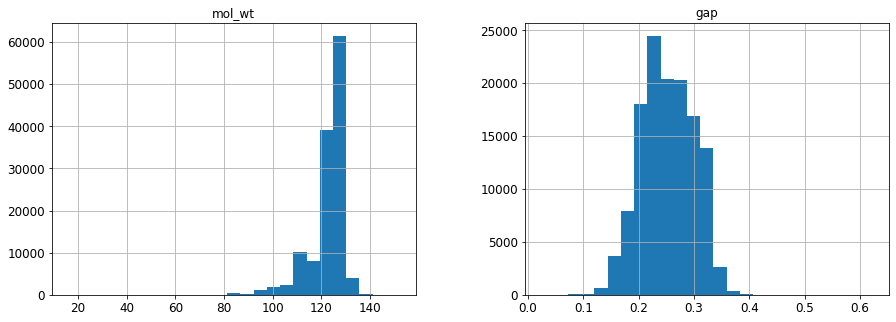

In [53]:
numeric_cols=['mol_wt','gap']
curated_df[numeric_cols].hist(figsize=(15,5), bins=25);

In [54]:
curated_df[numeric_cols].describe()

,mol_wt,gap
count,129435.000000,129435.000000
mean,122.692994,0.252584
std,7.570944,0.047279
min,16.031300,0.024600
25%,121.089149,0.217500
50%,125.047678,0.251500
75%,127.063329,0.289900
max,152.006069,0.622100


In [13]:
featurizer = 'ecfp' #featurizer = 'graphconv'
model_type ='RF'
response_cols = ['VALUE_NUM_mean']

In [ ]:
#model 1

In [66]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
      #  "split_valid_frac": "0.10",
       # "split_test_frac": "0.10",
        "featurizer": "ecfp",
        "model_type": "RF",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '5',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [67]:
ampl_param = parse.wrapper(params)

2023-06-26 18:46:52,058 Created a dataset hash 'd2268ed851266d40bf1e7a1c5b1e0a16' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [68]:
pl = mp.ModelPipeline(ampl_param)


In [69]:
pl.train_model()

2023-06-26 18:46:58,944 Attempting to load featurized dataset
2023-06-26 18:46:59,499 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-26 18:46:59,500 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-26 18:47:03,833 Featurizing sample 0
2023-06-26 18:47:05,326 Featurizing sample 1000
2023-06-26 18:47:06,534 Featurizing sample 2000
2023-06-26 18:47:07,790 Featurizing sample 3000
2023-06-26 18:47:09,038 Featurizing sample 4000
2023-06-26 18:47:10,334 Featurizing sample 5000
2023-06-26 18:47:11,589 Featurizing sample 6000
2023-06-26 18:47:12,841 Featurizing sample 7000
2023-06-26 18:47:14,087 Featurizing sample 8000
2023-06-26 18:47:15,344 Featurizing sample 9000
2023-06-26 18:47:16,600 Featurizing sample 10000
2023-06-26 18:47:17,855 Featurizing sample 11000
2023-06-26 18:47:19,120 Featurizing sample 12000
2023-06-26 18:47:20,414 Featurizing sample 13000
2023-06-26 18:47

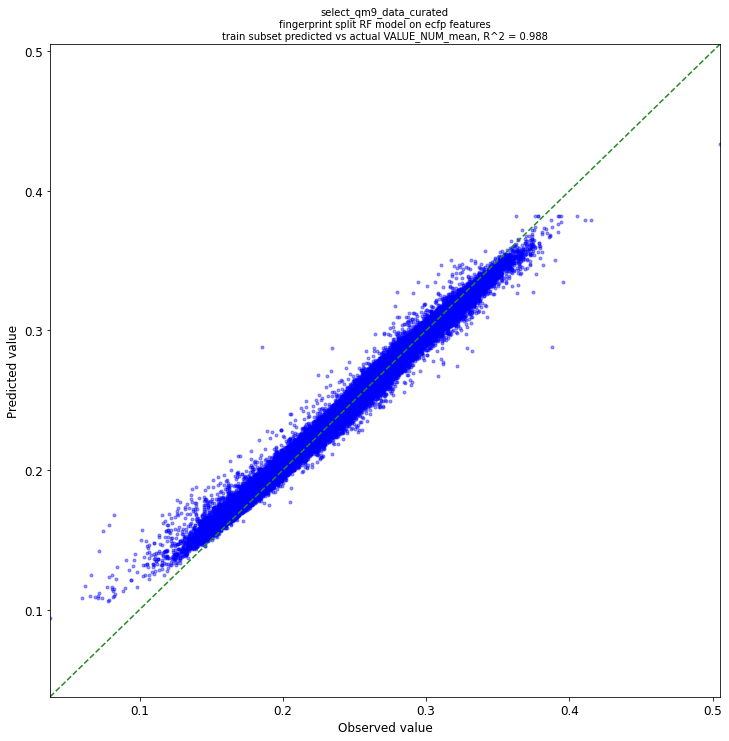

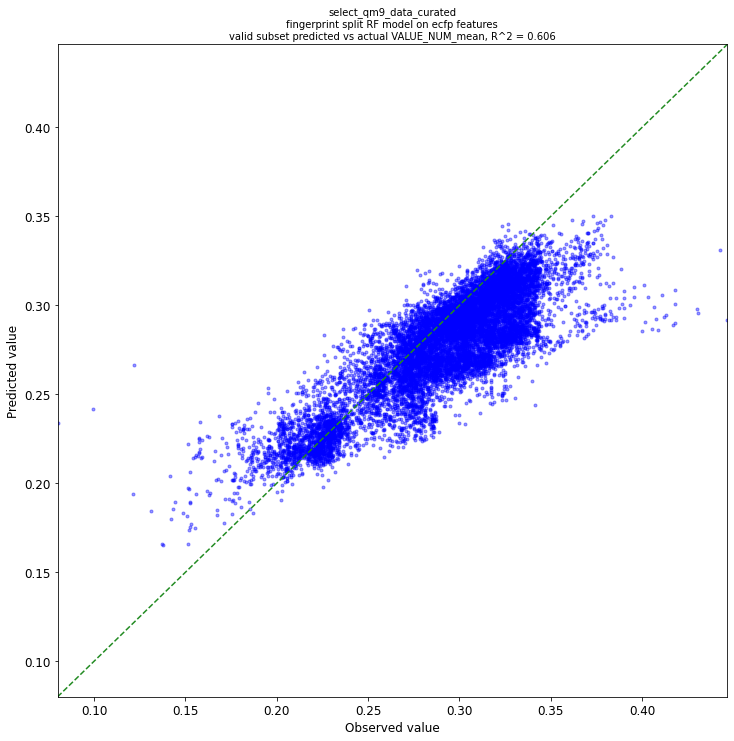

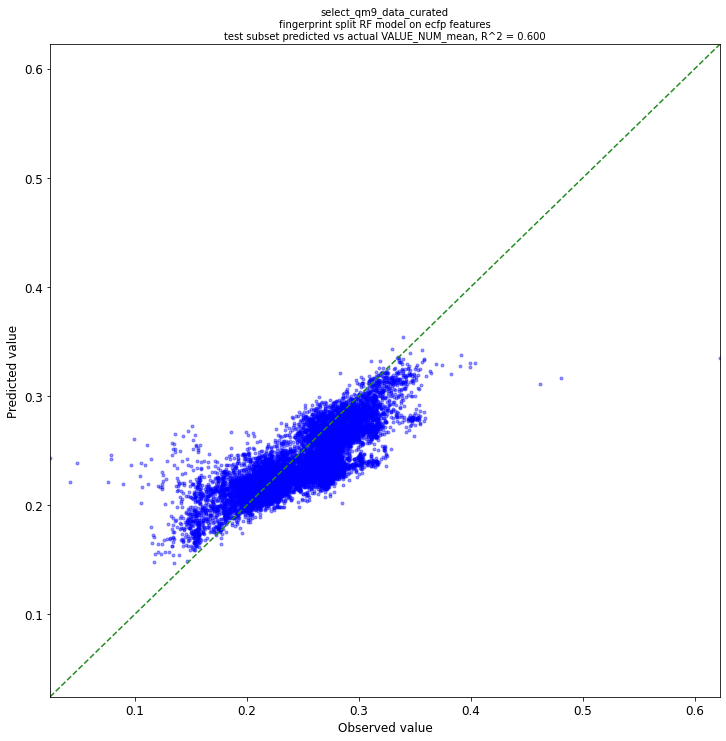

In [70]:
pp.plot_pred_vs_actual(pl)

In [ ]:
#model 2 --> epochs 10

In [14]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params1 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
      #  "split_valid_frac": "0.10",
       # "split_test_frac": "0.10",
        "featurizer": "ecfp",
        "model_type": "RF",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '10',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [15]:
ampl_param1 = parse.wrapper(params1)

2023-06-26 20:16:01,722 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [16]:
pl1 = mp.ModelPipeline(ampl_param1)

In [17]:
pl1.train_model()

2023-06-26 20:16:06,856 Attempting to load featurized dataset
2023-06-26 20:16:07,453 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-26 20:16:07,454 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-26 20:16:08,110 Featurizing sample 0
2023-06-26 20:16:09,353 Featurizing sample 1000
2023-06-26 20:16:10,570 Featurizing sample 2000
2023-06-26 20:16:11,814 Featurizing sample 3000
2023-06-26 20:16:13,084 Featurizing sample 4000
2023-06-26 20:16:14,408 Featurizing sample 5000
2023-06-26 20:16:15,691 Featurizing sample 6000
2023-06-26 20:16:16,947 Featurizing sample 7000
2023-06-26 20:16:18,231 Featurizing sample 8000
2023-06-26 20:16:19,488 Featurizing sample 9000
2023-06-26 20:16:20,766 Featurizing sample 10000
2023-06-26 20:16:22,073 Featurizing sample 11000
2023-06-26 20:16:23,373 Featurizing sample 12000
2023-06-26 20:16:24,663 Featurizing sample 13000
2023-06-26 20:16

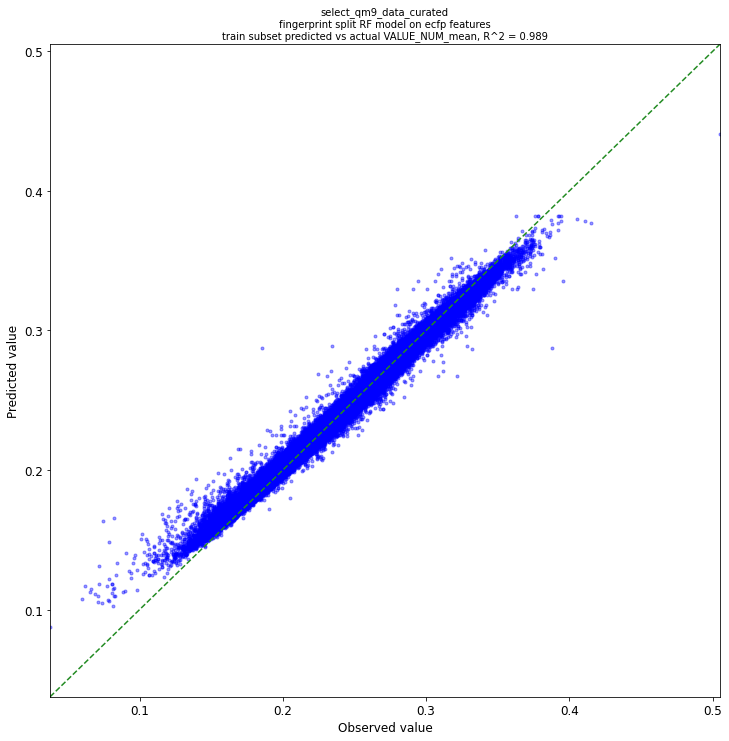

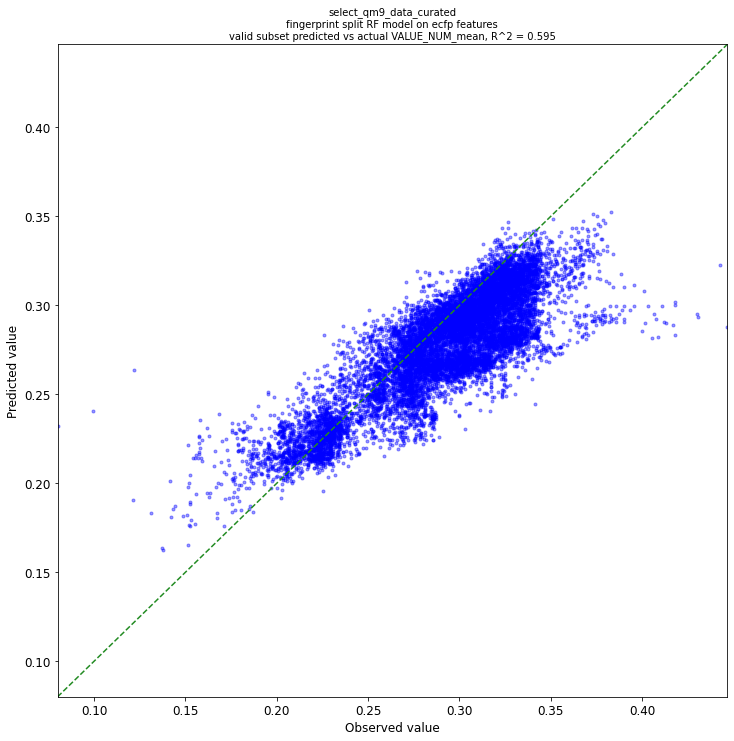

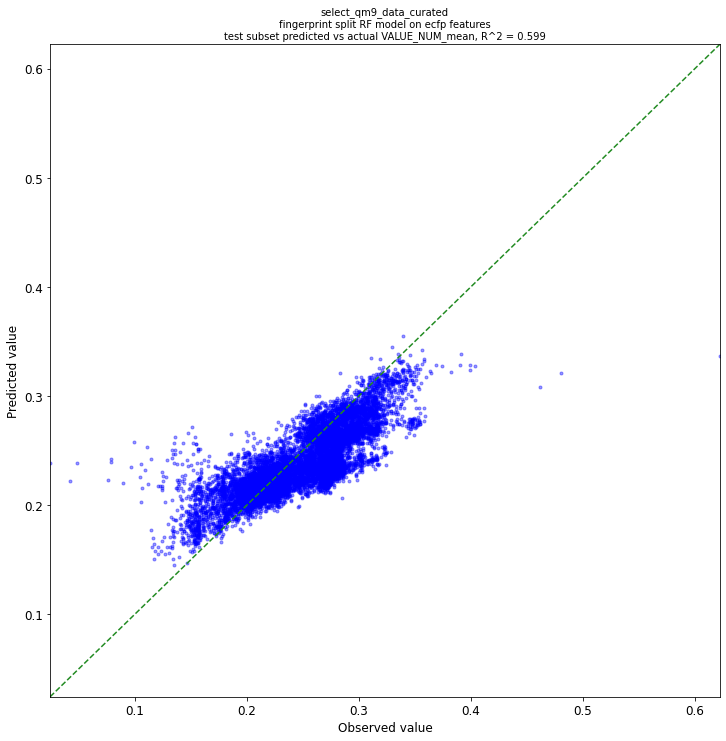

In [18]:
pp.plot_pred_vs_actual(pl1)

In [ ]:
#Model 3 --> NN

In [7]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params2 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
      #  "split_valid_frac": "0.10",
       # "split_test_frac": "0.10",
        "featurizer": "ecfp",
        "model_type": "NN",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '10',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [8]:
ampl_param2 = parse.wrapper(params2)

2023-06-27 20:00:04,790 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [9]:
pl2 = mp.ModelPipeline(ampl_param2)

In [10]:
pl2.train_model()

2023-06-27 20:00:10,749 Attempting to load featurized dataset
2023-06-27 20:00:11,370 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-27 20:00:11,371 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-27 20:00:12,006 Featurizing sample 0
2023-06-27 20:00:13,302 Featurizing sample 1000
2023-06-27 20:00:14,605 Featurizing sample 2000
2023-06-27 20:00:15,916 Featurizing sample 3000
2023-06-27 20:00:17,257 Featurizing sample 4000
2023-06-27 20:00:18,634 Featurizing sample 5000
2023-06-27 20:00:19,964 Featurizing sample 6000
2023-06-27 20:00:21,286 Featurizing sample 7000
2023-06-27 20:00:22,620 Featurizing sample 8000
2023-06-27 20:00:23,927 Featurizing sample 9000
2023-06-27 20:00:25,241 Featurizing sample 10000
2023-06-27 20:00:26,580 Featurizing sample 11000
2023-06-27 20:00:27,964 Featurizing sample 12000
2023-06-27 20:00:29,322 Featurizing sample 13000
2023-06-27 20:00

['select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint1.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint2.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint3.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint4.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint5.pt']
select_qm9_data_curated/NN_ecfp_fingerprint_regression/71397a70-cef7-4d04-822d-5828768a2f62/model/checkpoint1.pt


2023-06-27 20:50:32,645 Wrote model tarball to select_qm9_data_curated_model_71397a70-cef7-4d04-822d-5828768a2f62.tar.gz


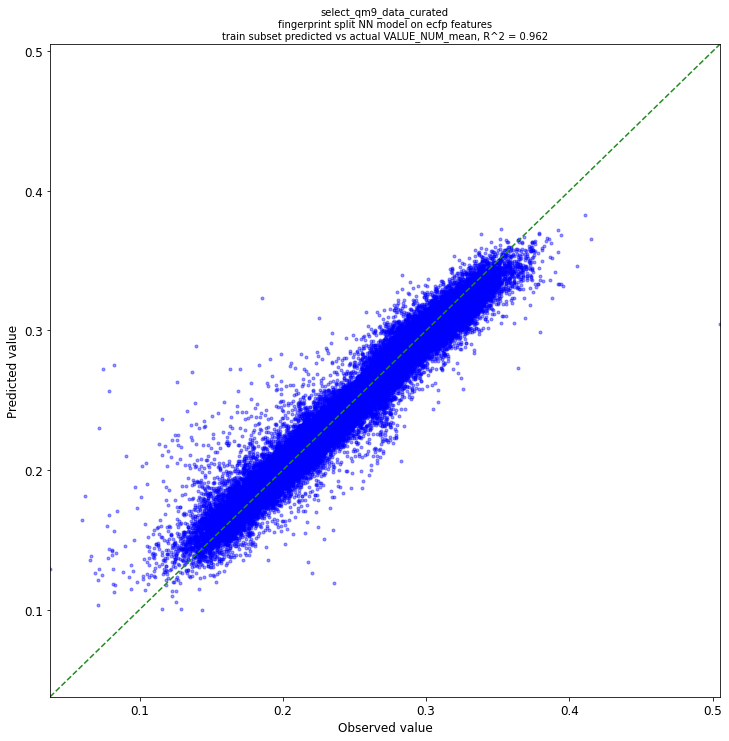

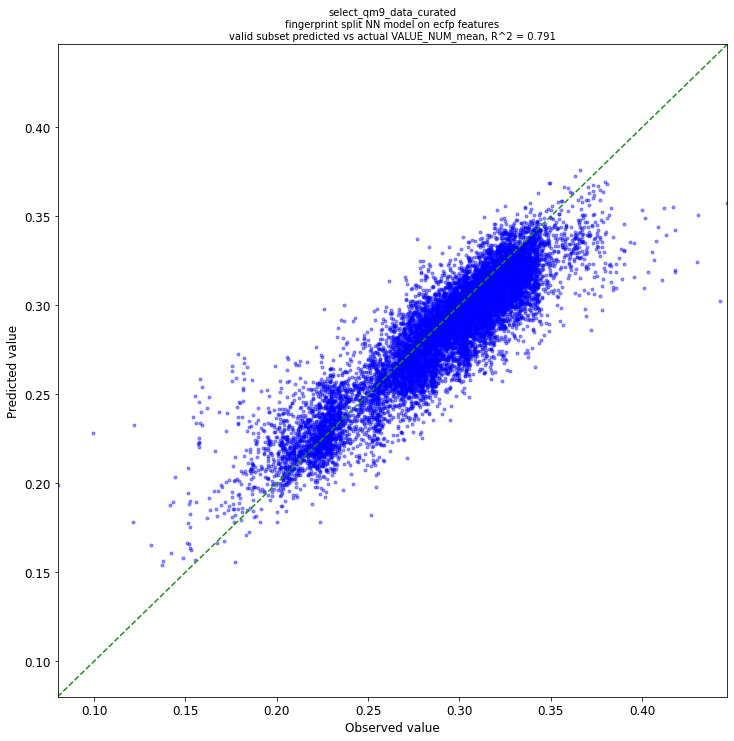

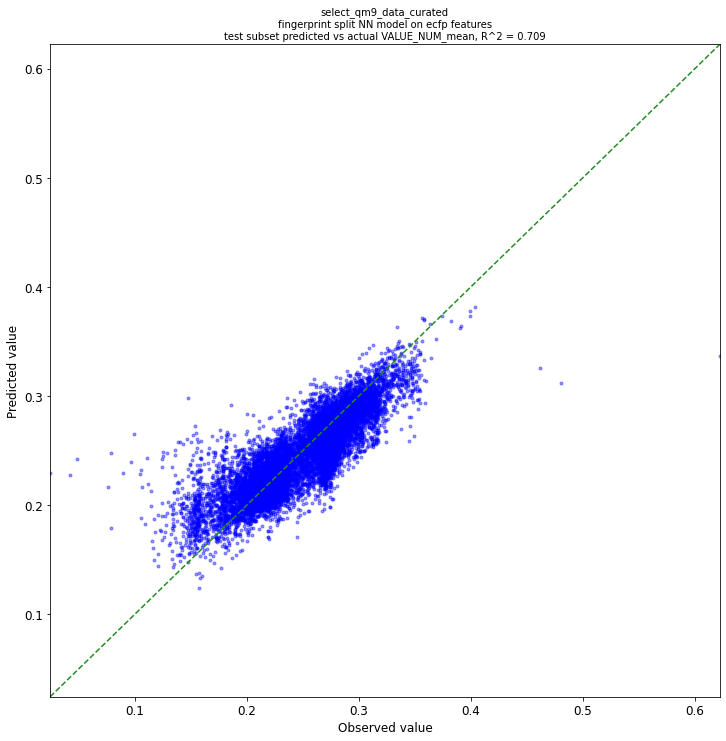

In [11]:
pp.plot_pred_vs_actual(pl2)

In [ ]:
#model 4 --> NN and change split to 0.15

In [12]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params3 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
        "split_valid_frac": "0.15",
        "split_test_frac": "0.15",
        "featurizer": "ecfp",
        "model_type": "NN",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '10',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [13]:
ampl_param3 = parse.wrapper(params3)
pl3 = mp.ModelPipeline(ampl_param3)

2023-06-27 22:19:15,925 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [14]:
pl3.train_model()

2023-06-27 22:19:32,578 Attempting to load featurized dataset
2023-06-27 22:19:33,186 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-27 22:19:33,187 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-27 22:19:33,800 Featurizing sample 0
2023-06-27 22:19:35,098 Featurizing sample 1000
2023-06-27 22:19:36,392 Featurizing sample 2000
2023-06-27 22:19:37,702 Featurizing sample 3000
2023-06-27 22:19:39,053 Featurizing sample 4000
2023-06-27 22:19:40,435 Featurizing sample 5000
2023-06-27 22:19:41,756 Featurizing sample 6000
2023-06-27 22:19:43,057 Featurizing sample 7000
2023-06-27 22:19:44,379 Featurizing sample 8000
2023-06-27 22:19:45,657 Featurizing sample 9000
2023-06-27 22:19:46,936 Featurizing sample 10000
2023-06-27 22:19:48,282 Featurizing sample 11000
2023-06-27 22:19:49,608 Featurizing sample 12000
2023-06-27 22:19:50,964 Featurizing sample 13000
2023-06-27 22:19

['select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint1.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint2.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint3.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint4.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint5.pt']
select_qm9_data_curated/NN_ecfp_fingerprint_regression/89cd7a1f-6531-454c-bc1f-392cff327831/model/checkpoint1.pt


2023-06-27 23:10:16,891 Wrote model tarball to select_qm9_data_curated_model_89cd7a1f-6531-454c-bc1f-392cff327831.tar.gz


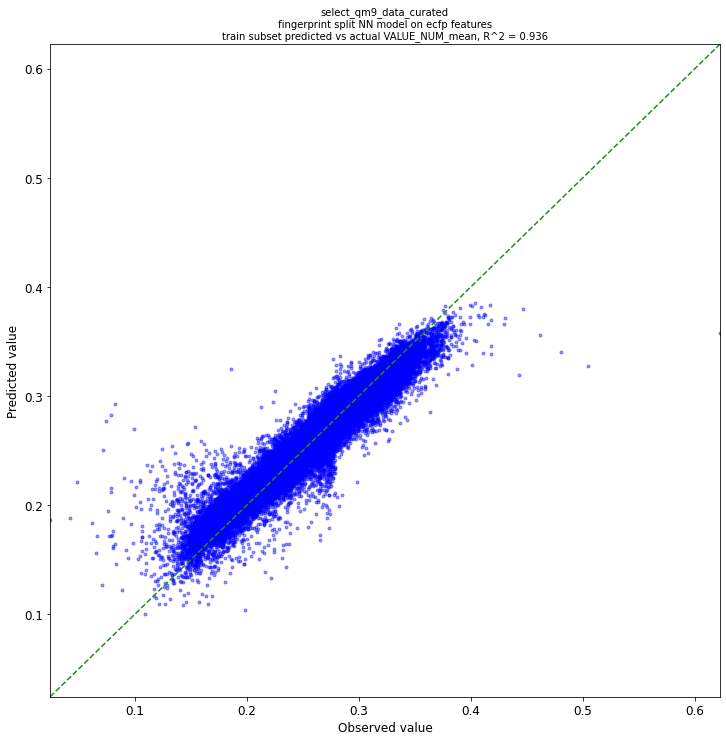

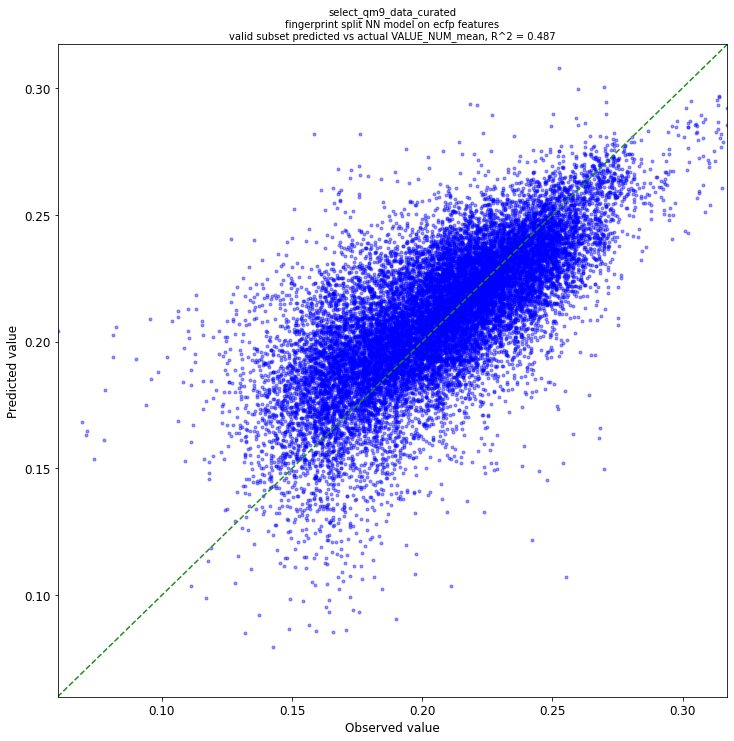

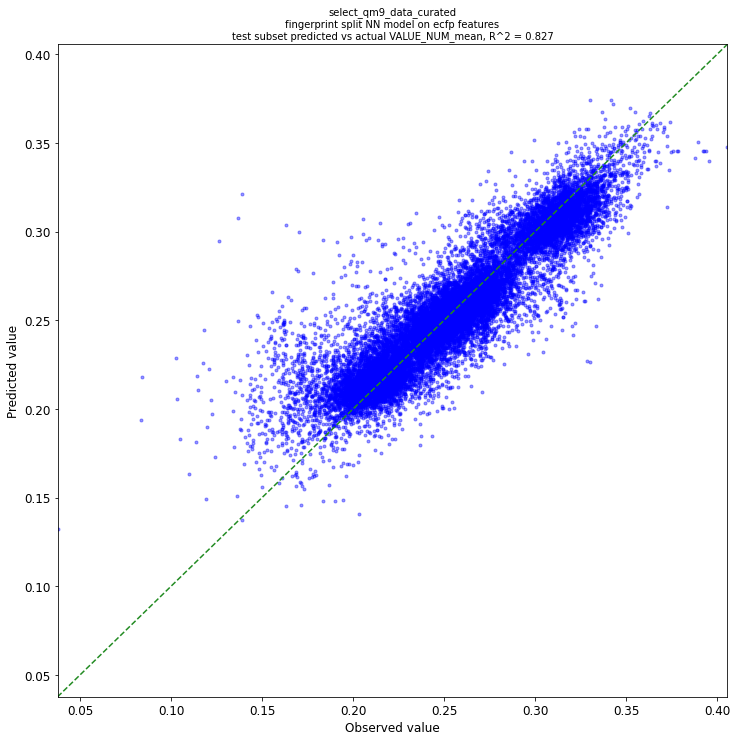

In [15]:
pp.plot_pred_vs_actual(pl3)

In [ ]:
#model 5: NN, split 0.15, epoch 20

In [16]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params4 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
        "split_valid_frac": "0.15",
        "split_test_frac": "0.15",
        "featurizer": "ecfp",
        "model_type": "NN",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '20',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [17]:
ampl_param4 = parse.wrapper(params4)
pl4 = mp.ModelPipeline(ampl_param4)

2023-06-27 23:37:14,452 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [18]:
pl4.train_model()

2023-06-27 23:37:33,285 Attempting to load featurized dataset
2023-06-27 23:37:33,772 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-27 23:37:33,773 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-27 23:37:34,266 Featurizing sample 0
2023-06-27 23:37:35,452 Featurizing sample 1000
2023-06-27 23:37:36,642 Featurizing sample 2000
2023-06-27 23:37:37,815 Featurizing sample 3000
2023-06-27 23:37:39,020 Featurizing sample 4000
2023-06-27 23:37:40,264 Featurizing sample 5000
2023-06-27 23:37:41,480 Featurizing sample 6000
2023-06-27 23:37:42,686 Featurizing sample 7000
2023-06-27 23:37:43,896 Featurizing sample 8000
2023-06-27 23:37:45,093 Featurizing sample 9000
2023-06-27 23:37:46,322 Featurizing sample 10000
2023-06-27 23:37:47,548 Featurizing sample 11000
2023-06-27 23:37:48,796 Featurizing sample 12000
2023-06-27 23:37:50,035 Featurizing sample 13000
2023-06-27 23:37

['select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint1.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint2.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint3.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint4.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint5.pt']
select_qm9_data_curated/NN_ecfp_fingerprint_regression/9eda46c1-4e0e-4102-9758-73aa83579e6f/model/checkpoint1.pt


2023-06-28 00:30:47,613 Wrote model tarball to select_qm9_data_curated_model_9eda46c1-4e0e-4102-9758-73aa83579e6f.tar.gz


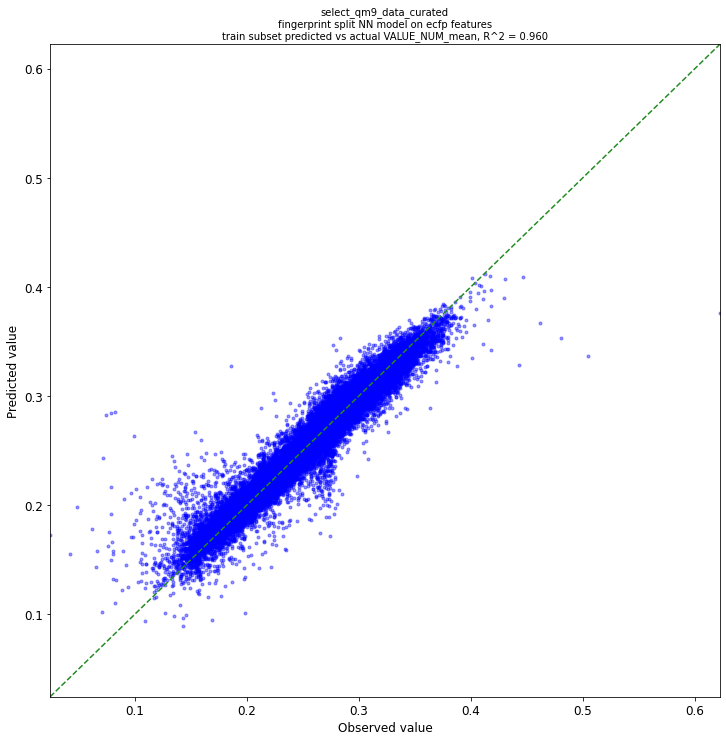

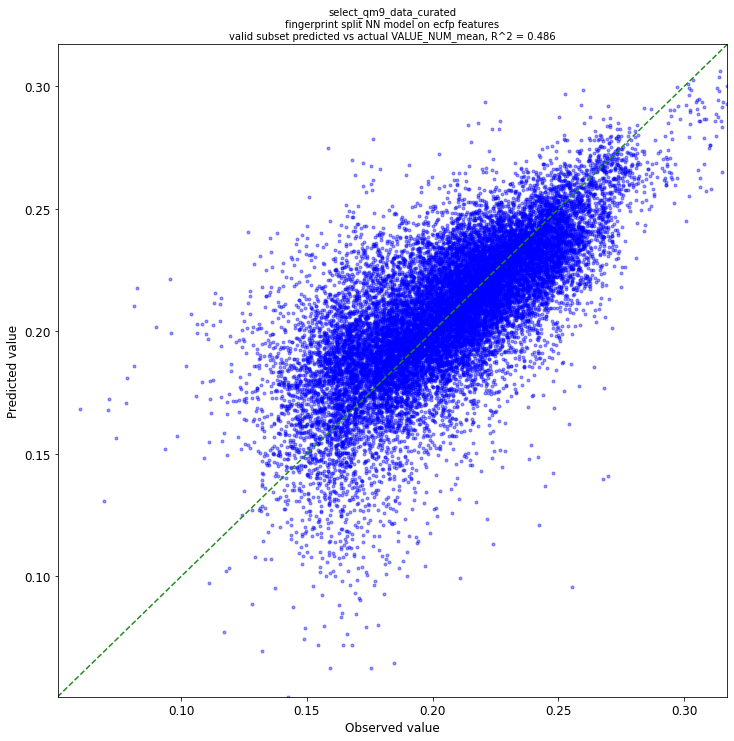

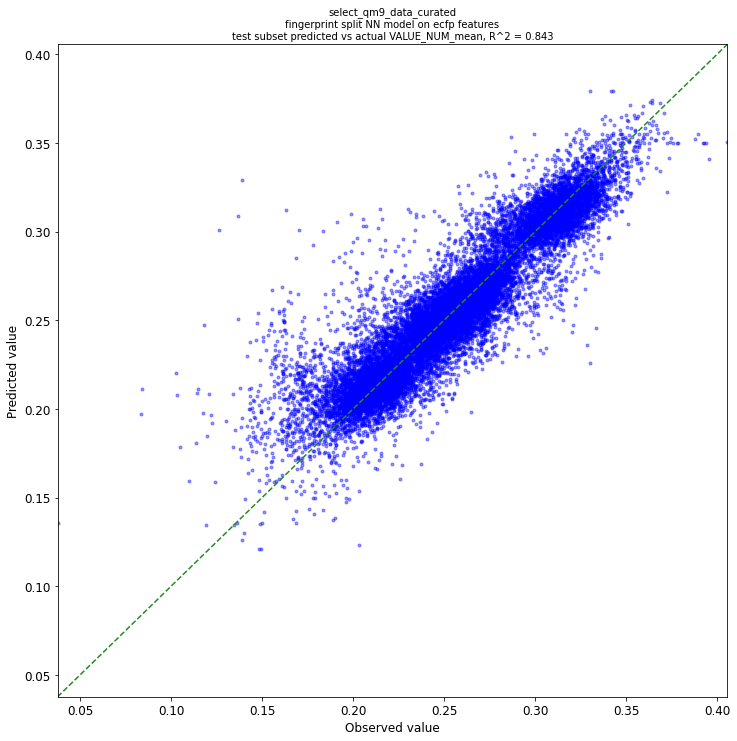

In [19]:
pp.plot_pred_vs_actual(pl4)

In [ ]:
#model 6: NN, split 0.15, epoch 5

In [31]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params5 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
        "split_valid_frac": "0.15",
        "split_test_frac": "0.15",
        "featurizer": "ecfp",
        "model_type": "NN",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '5',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [32]:
ampl_param5 = parse.wrapper(params5)
pl5 = mp.ModelPipeline(ampl_param5)

2023-06-28 20:30:54,533 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [33]:
pl5.train_model()

2023-06-28 20:30:56,757 Attempting to load featurized dataset
2023-06-28 20:30:57,336 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-28 20:30:57,337 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-28 20:30:57,914 Featurizing sample 0
2023-06-28 20:30:59,191 Featurizing sample 1000
2023-06-28 20:31:00,490 Featurizing sample 2000
2023-06-28 20:31:01,719 Featurizing sample 3000
2023-06-28 20:31:03,045 Featurizing sample 4000
2023-06-28 20:31:04,402 Featurizing sample 5000
2023-06-28 20:31:05,660 Featurizing sample 6000
2023-06-28 20:31:06,889 Featurizing sample 7000
2023-06-28 20:31:08,166 Featurizing sample 8000
2023-06-28 20:31:09,436 Featurizing sample 9000
2023-06-28 20:31:10,699 Featurizing sample 10000
2023-06-28 20:31:11,969 Featurizing sample 11000
2023-06-28 20:31:13,243 Featurizing sample 12000
2023-06-28 20:31:14,496 Featurizing sample 13000
2023-06-28 20:31

['select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint1.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint2.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint3.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint4.pt', 'select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint5.pt']
select_qm9_data_curated/NN_ecfp_fingerprint_regression/5fb316a7-ae0e-4527-8c36-f8fb3589223b/model/checkpoint1.pt


2023-06-28 21:19:01,884 Wrote model tarball to select_qm9_data_curated_model_5fb316a7-ae0e-4527-8c36-f8fb3589223b.tar.gz


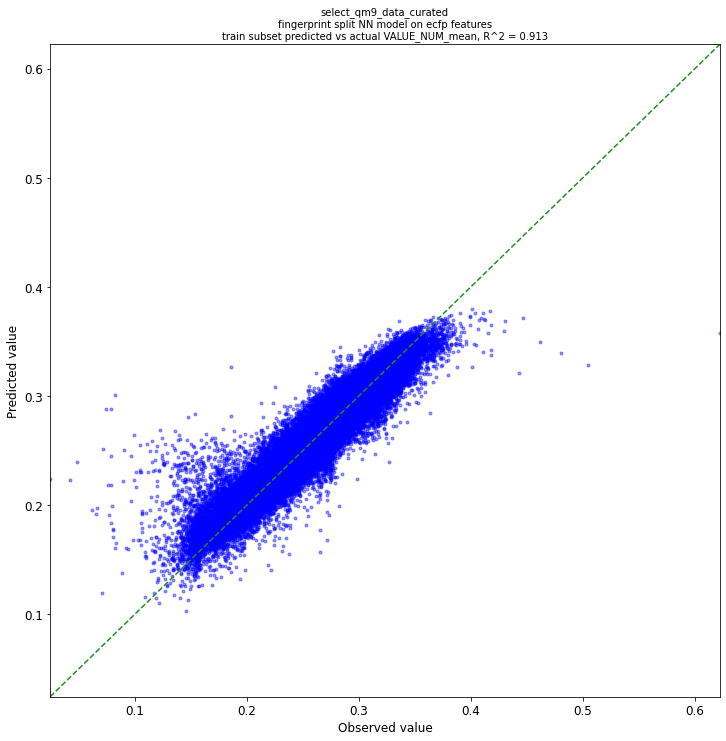

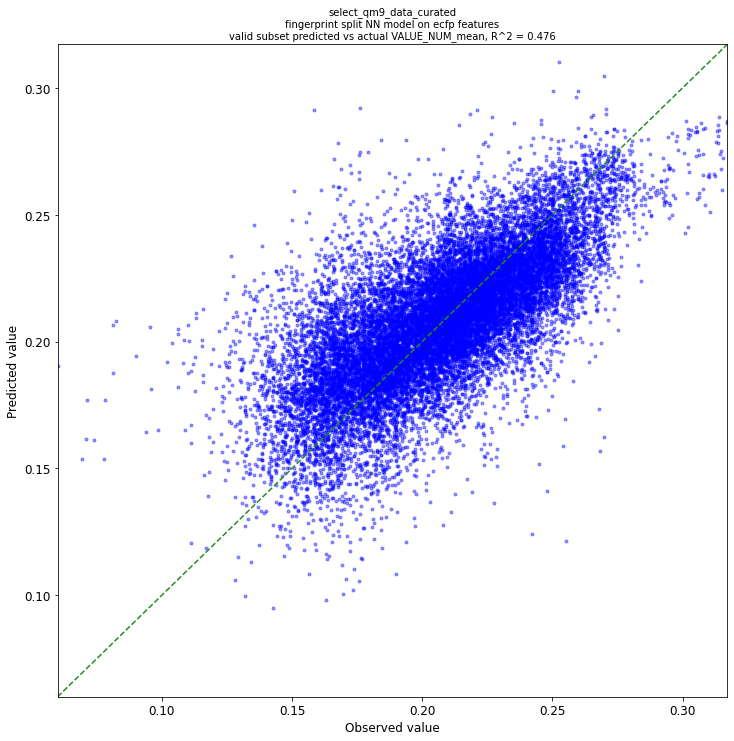

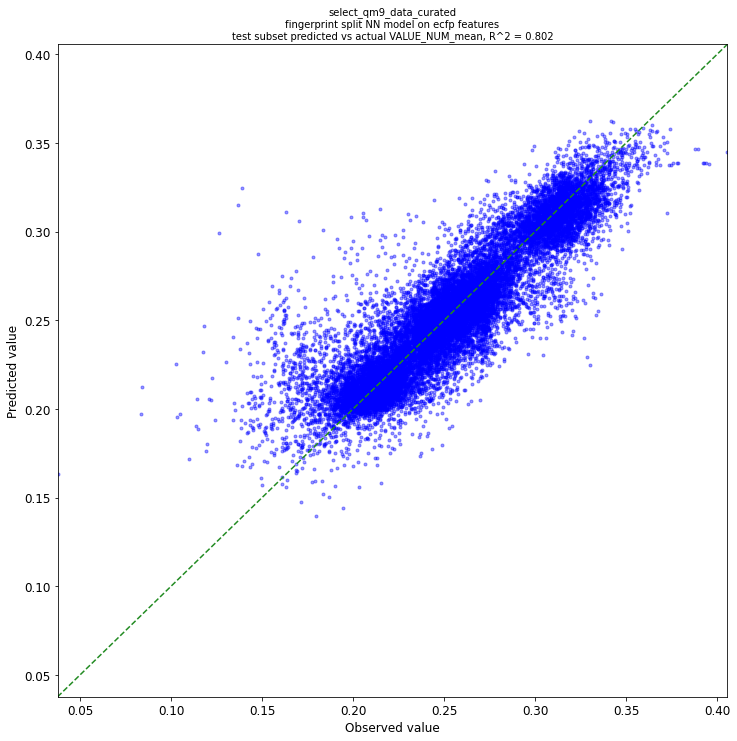

In [34]:
pp.plot_pred_vs_actual(pl5)

In [ ]:
#model 7: RF, split 0.15, epoch 20

In [7]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params6 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
        "split_valid_frac": "0.15",
        "split_test_frac": "0.15",
        "featurizer": "ecfp",
        "model_type": "RF",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '20',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [8]:
ampl_param6 = parse.wrapper(params6)
pl6 = mp.ModelPipeline(ampl_param6)

2023-06-29 15:15:05,830 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [9]:
pl6.train_model()

2023-06-29 15:15:09,085 Attempting to load featurized dataset
2023-06-29 15:15:09,871 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-29 15:15:09,873 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-29 15:15:10,654 Featurizing sample 0
2023-06-29 15:15:12,137 Featurizing sample 1000
2023-06-29 15:15:13,635 Featurizing sample 2000
2023-06-29 15:15:15,220 Featurizing sample 3000
2023-06-29 15:15:16,867 Featurizing sample 4000
2023-06-29 15:15:18,486 Featurizing sample 5000
2023-06-29 15:15:20,063 Featurizing sample 6000
2023-06-29 15:15:21,632 Featurizing sample 7000
2023-06-29 15:15:23,225 Featurizing sample 8000
2023-06-29 15:15:24,807 Featurizing sample 9000
2023-06-29 15:15:26,360 Featurizing sample 10000
2023-06-29 15:15:28,013 Featurizing sample 11000
2023-06-29 15:15:29,634 Featurizing sample 12000
2023-06-29 15:15:31,254 Featurizing sample 13000
2023-06-29 15:15

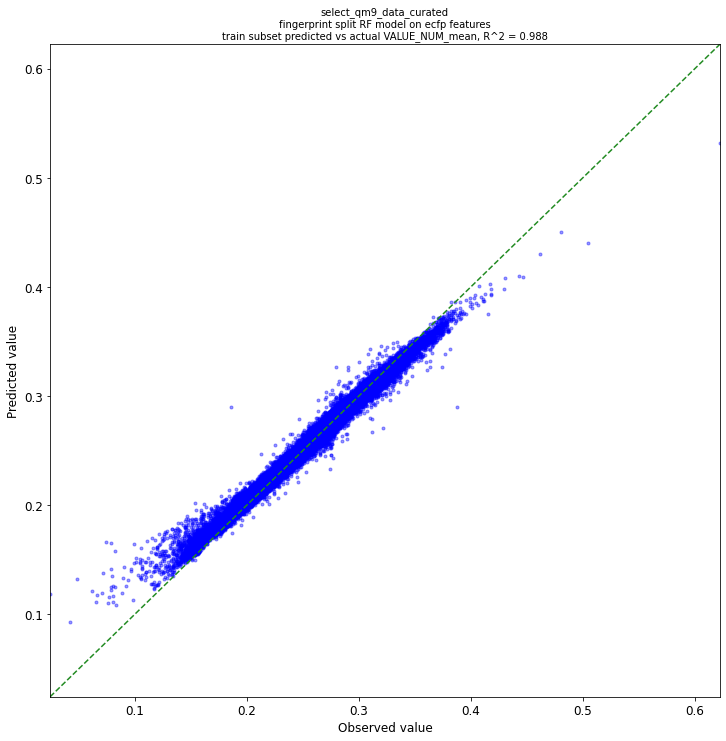

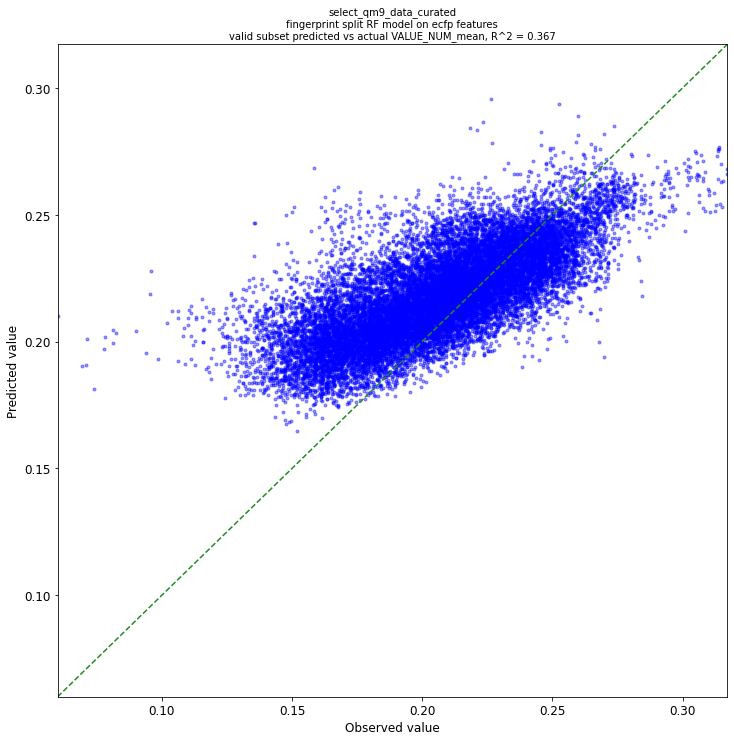

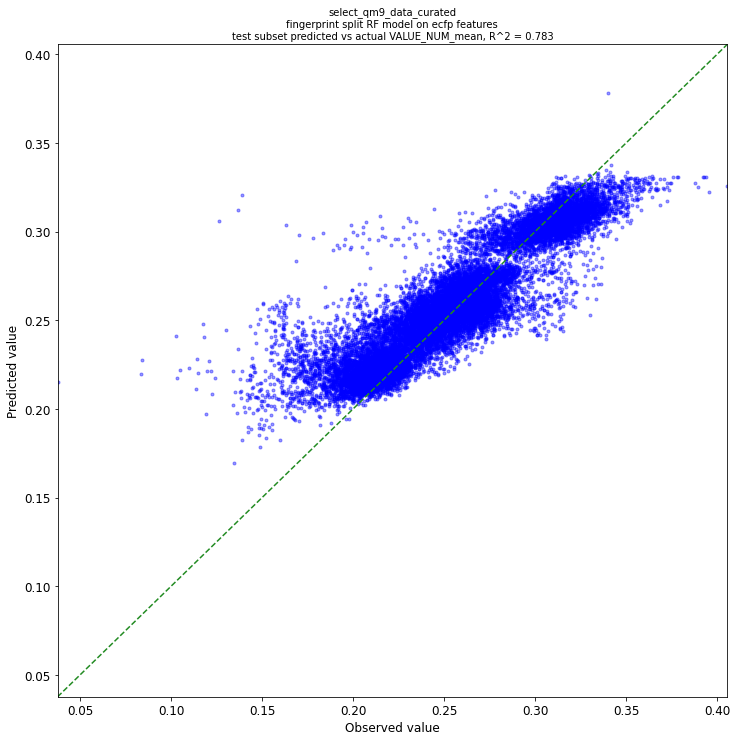

In [10]:
pp.plot_pred_vs_actual(pl6)

In [ ]:
#model 8: RF, 0.1, 20 epochs

In [14]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params8 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
      #  "split_valid_frac": "0.10",
       # "split_test_frac": "0.10",
        "featurizer": "ecfp",
        "model_type": "RF",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '20',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [15]:
ampl_param8 = parse.wrapper(params8)
pl8 = mp.ModelPipeline(ampl_param8)

2023-06-30 16:44:18,408 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [16]:
pl8.train_model()

2023-06-30 16:44:30,197 Attempting to load featurized dataset
2023-06-30 16:44:31,011 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-30 16:44:31,012 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-30 16:44:31,819 Featurizing sample 0
2023-06-30 16:44:33,380 Featurizing sample 1000
2023-06-30 16:44:34,951 Featurizing sample 2000
2023-06-30 16:44:36,529 Featurizing sample 3000
2023-06-30 16:44:38,098 Featurizing sample 4000
2023-06-30 16:44:39,640 Featurizing sample 5000
2023-06-30 16:44:41,122 Featurizing sample 6000
2023-06-30 16:44:42,645 Featurizing sample 7000
2023-06-30 16:44:44,220 Featurizing sample 8000
2023-06-30 16:44:45,804 Featurizing sample 9000
2023-06-30 16:44:47,366 Featurizing sample 10000
2023-06-30 16:44:48,920 Featurizing sample 11000
2023-06-30 16:44:50,449 Featurizing sample 12000
2023-06-30 16:44:51,927 Featurizing sample 13000
2023-06-30 16:44

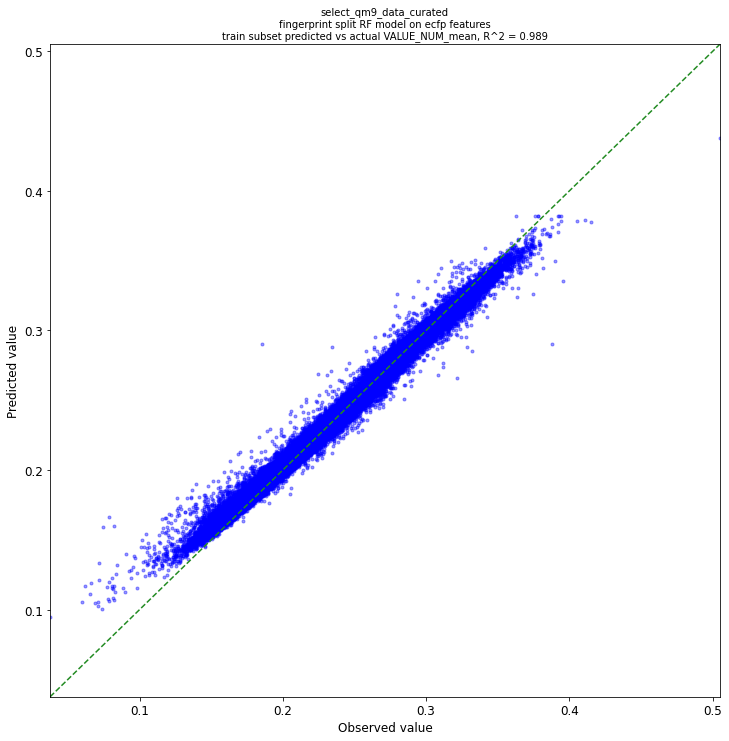

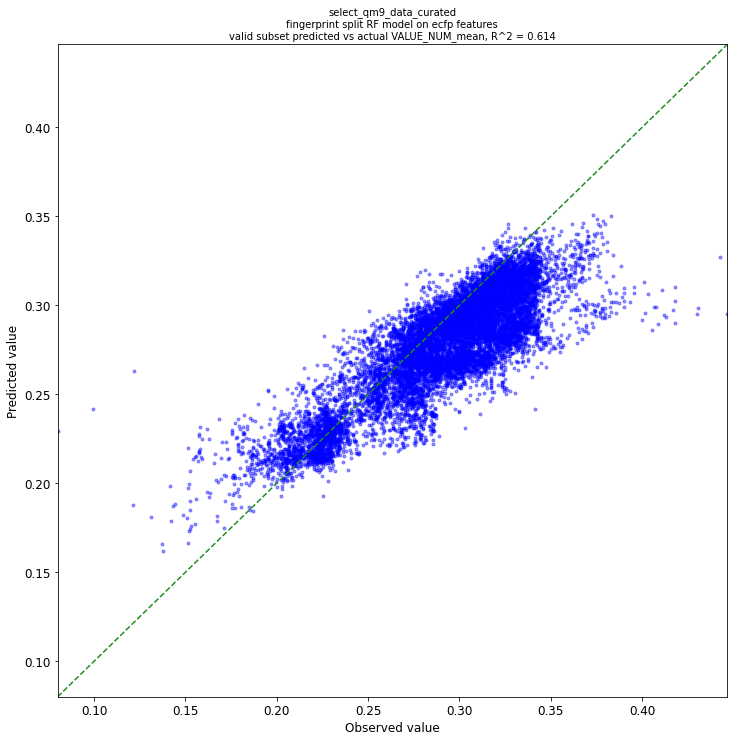

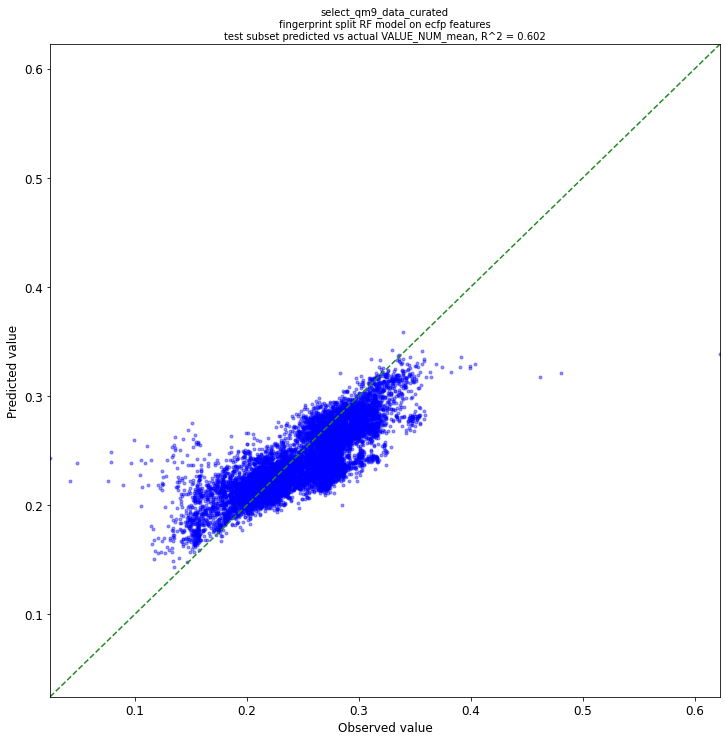

In [17]:
pp.plot_pred_vs_actual(pl8)

In [ ]:
#model 9: RF, 0.1, epoch = 30

In [20]:
## Several of these parameters you can modify.  Make sure the columns you call, are actually in your dataset.  model_type has three different options, we can look at RF and NN, chloe used NN in QMUGs training.  
## "splitter" is also a location  to change, several options, but Kevin used scaffold and fingerprint.  
## max_epochs you can start low, and see how that changes the r^2 value.

response_col = ['VALUE_NUM_mean']
compound_id = "compound_id"
smiles_col = "rdkit_smiles"

params9 = {
        "verbose": "True",
        "datastore": "False",
        "save_results": "False",
        "prediction_type": "regression",
        "dataset_key": curated_file,
        "id_col": compound_id,
        "smiles_col": smiles_col,
        "response_cols": response_col,
        "previously_split": "False",
        "split_only": "False",
        "split_strategy": "train_valid_test",
        "splitter": "fingerprint",
      #  "split_valid_frac": "0.10",
       # "split_test_frac": "0.10",
        "featurizer": "ecfp",
        "model_type": "RF",
        "verbose": "True",
        "transformers": "True",
        'max_epochs': '30',
        "rerun": "False",
        "result_dir": ""
        # "ampl_version": " "
    }

In [21]:
ampl_param9 = parse.wrapper(params9)
pl9 = mp.ModelPipeline(ampl_param9)

2023-06-30 17:51:27,665 Created a dataset hash 'ae754ed88fc106c31c9fea2b886ab532' from dataset_key '/home/jupyter/Summer_AMPL/Renate/QM9 Curation/select_qm9_data_curated.csv'


In [22]:
pl9.train_model()

2023-06-30 17:51:30,708 Attempting to load featurized dataset
2023-06-30 17:51:31,412 Exception when trying to load featurized data:
DynamicFeaturization doesn't support get_featurized_dset_name()
2023-06-30 17:51:31,414 Featurized dataset not previously saved for dataset select_qm9_data_curated, creating new
2023-06-30 17:51:34,266 Featurizing sample 0
2023-06-30 17:51:35,866 Featurizing sample 1000
2023-06-30 17:51:37,336 Featurizing sample 2000
2023-06-30 17:51:38,790 Featurizing sample 3000
2023-06-30 17:51:40,246 Featurizing sample 4000
2023-06-30 17:51:41,700 Featurizing sample 5000
2023-06-30 17:51:43,161 Featurizing sample 6000
2023-06-30 17:51:44,617 Featurizing sample 7000
2023-06-30 17:51:46,090 Featurizing sample 8000
2023-06-30 17:51:47,500 Featurizing sample 9000
2023-06-30 17:51:48,895 Featurizing sample 10000
2023-06-30 17:51:50,344 Featurizing sample 11000
2023-06-30 17:51:51,790 Featurizing sample 12000
2023-06-30 17:51:53,223 Featurizing sample 13000
2023-06-30 17:51

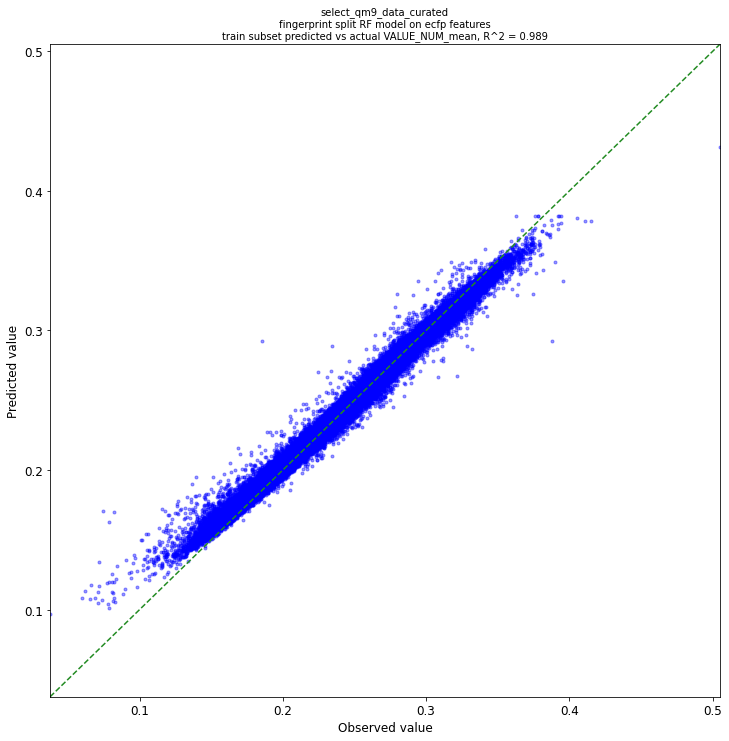

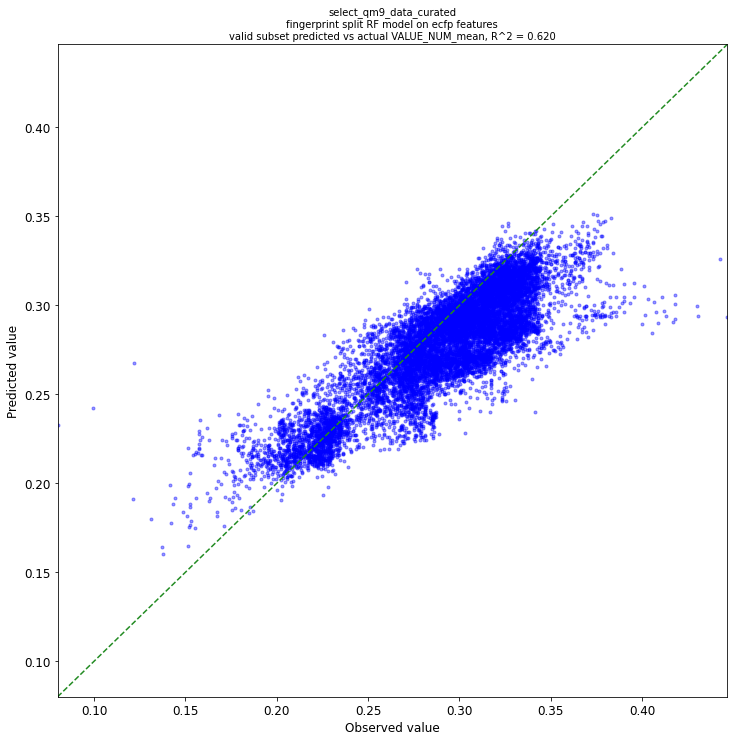

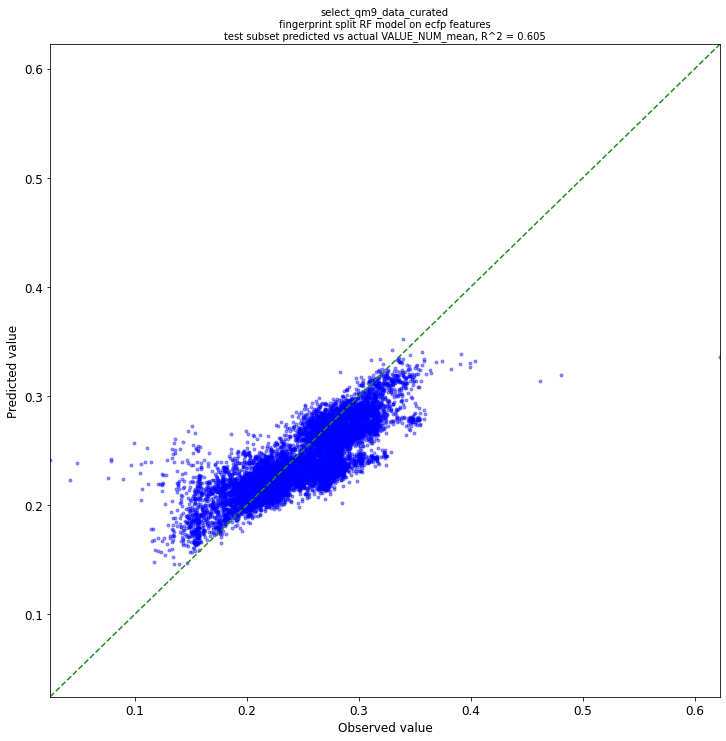

In [23]:
pp.plot_pred_vs_actual(pl9)